In [1]:
import os
import random

import cv2
import numpy as np

import torch
from torch.utils.data import DataLoader
from torchvision import models

from src.resnet_yolo import resnet50
from yolo_loss import YoloLoss
from src.dataset import VocDetectorDataset, get_train_test
from src.eval import evaluate
from src.predict import predict_image
from src.config import VOC_CLASSES, COLORS

import matplotlib.pyplot as plt
import collections

%matplotlib inline
%load_ext autoreload
%autoreload 2

## Initialization

In [2]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [3]:
# YOLO network hyperparameters
B = 2  # number of bounding box predictions per cell
S = 14  # width/height of network output grid (larger than 7x7 from paper since we use a different network)

To implement Yolo we will rely on a pretrained classifier as the backbone for our detection network. PyTorch offers a variety of models which are pretrained on ImageNet in the [`torchvision.models`](https://pytorch.org/docs/stable/torchvision/models.html) package. In particular, we will use the ResNet50 architecture as a base for our detector. This is different from the base architecture in the Yolo paper and also results in a different output grid size (14x14 instead of 7x7).

Models are typically pretrained on ImageNet since the dataset is very large (> 1 million images) and widely used. The pretrained model provides a very useful weight initialization for our detector, so that the network is able to learn quickly and effectively.

In [4]:
load_network_path = None
pretrained = True

# use to load a previously trained network
if load_network_path is not None:
    print('Loading saved network from {}'.format(load_network_path))
    net = resnet50().to(device)
    net.load_state_dict(torch.load(load_network_path))
else:
    print('Load pre-trained model')
    net = resnet50(pretrained=pretrained).to(device)

Load pre-trained model


/home/albyyuggle/Code/CS498/venv2/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/albyyuggle/Code/CS498/venv2/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [5]:
learning_rate = 0.003
num_epochs = 1
batch_size = 20

# Yolo loss component coefficients (as given in Yolo v1 paper)
lambda_coord = 5
lambda_noobj = 0.3

## Reading Pascal Data

Since Pascal is a small dataset (5000 in train+val) we have combined the train and val splits to train our detector. This is not typically a good practice, but we will make an exception in this case to be able to get reasonable detection results with a comparatively small object detection dataset.

The train dataset loader also using a variety of data augmentation techniques including random shift, scaling, crop, and flips. Data augmentation is slightly more complicated for detection datasets since the bounding box annotations must be kept consistent throughout the transformations.

Since the output of the detector network we train is an SxSx(B*5+C), we use an encoder to convert the original bounding box coordinates into relative grid bounding box coordinates corresponding to the expected output. We also use a decoder which allows us to convert the opposite direction into image coordinate bounding boxes.

In [6]:
train_dataset, test_dataset = get_train_test()
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset,batch_size=1,shuffle=False)

Initializing dataset
Initializing dataset


## Set up training tools

In [7]:
criterion = YoloLoss(S, B, lambda_coord, lambda_noobj)
optimizer = torch.optim.SGD(net.parameters(), lr=learning_rate, momentum=0.9, weight_decay=5e-4)
# optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)

## Train detector



Starting epoch 1 / 1
Learning Rate for this epoch: 0.001
0 / 8163
Epoch [1/1], Iter [100/8163], Loss: total=218.460, reg=32.048, containing_obj=16.505, no_obj=34.531, cls=31.354
100 / 8163
Epoch [1/1], Iter [200/8163], Loss: total=205.498, reg=29.786, containing_obj=21.985, no_obj=17.265, cls=29.405
200 / 8163
Epoch [1/1], Iter [300/8163], Loss: total=196.592, reg=28.147, containing_obj=24.323, no_obj=11.510, cls=28.080
300 / 8163
Epoch [1/1], Iter [400/8163], Loss: total=191.994, reg=27.126, containing_obj=26.279, no_obj=8.633, cls=27.496
400 / 8163
Epoch [1/1], Iter [500/8163], Loss: total=187.309, reg=26.249, containing_obj=27.320, no_obj=6.906, cls=26.672
500 / 8163
Epoch [1/1], Iter [600/8163], Loss: total=184.578, reg=25.654, containing_obj=28.550, no_obj=5.755, cls=26.031
600 / 8163
Epoch [1/1], Iter [700/8163], Loss: total=183.395, reg=25.301, containing_obj=29.696, no_obj=4.933, cls=25.714
700 / 8163
Epoch [1/1], Iter [800/8163], Loss: total=182.292, reg=24.967, containing_o

100%|██████████| 492/492 [00:03<00:00, 148.51it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0--- (no predictions for this class)
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=5.392, reg=0.861, containing_obj=0.804, no_obj=0.000, cls=0.284
Updating best test loss: 2652.89008
predicting...
[[(0, 0), (0, 0), 'vehicle', 1, 0.0]]


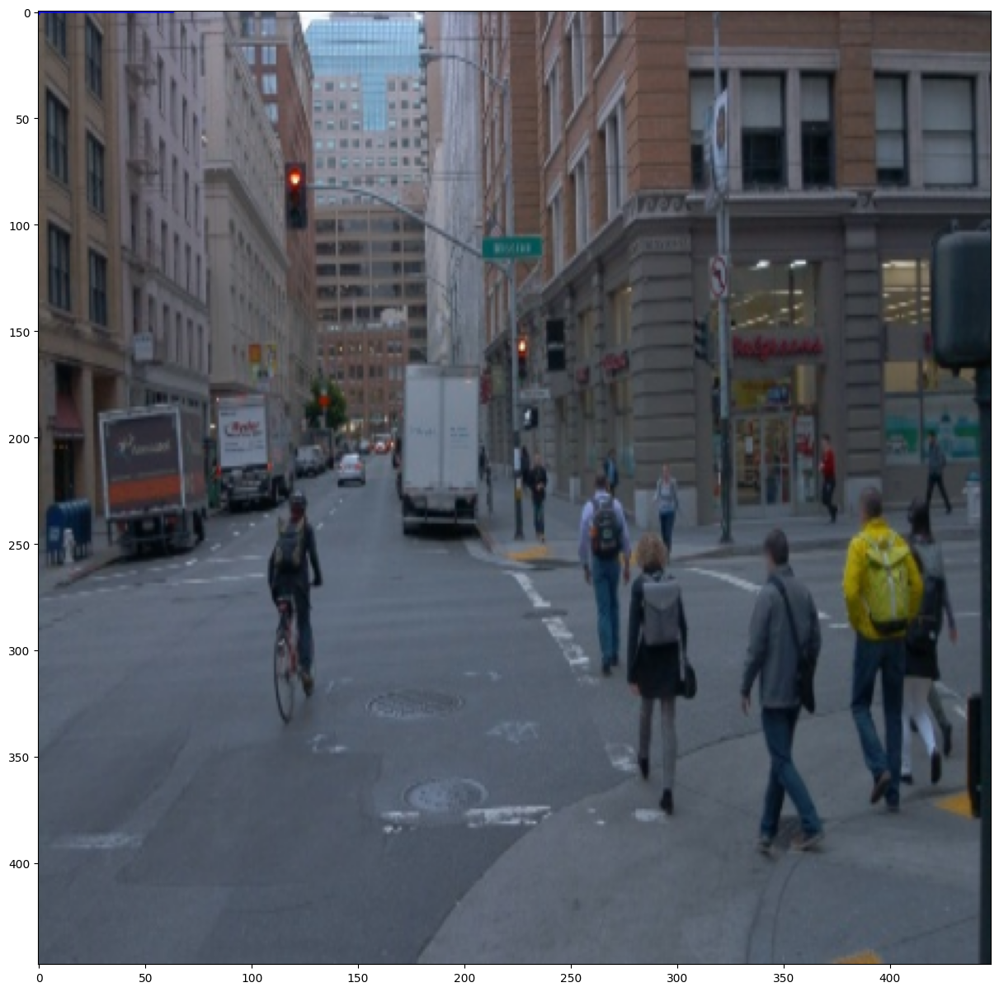

1000 / 8163
Epoch [1/1], Iter [1100/8163], Loss: total=176.678, reg=23.811, containing_obj=32.976, no_obj=3.139, cls=23.707
1100 / 8163
Epoch [1/1], Iter [1200/8163], Loss: total=175.207, reg=23.506, containing_obj=33.531, no_obj=2.878, cls=23.284
1200 / 8163
Epoch [1/1], Iter [1300/8163], Loss: total=173.681, reg=23.190, containing_obj=34.035, no_obj=2.656, cls=22.897
1300 / 8163
Epoch [1/1], Iter [1400/8163], Loss: total=172.612, reg=22.958, containing_obj=34.545, no_obj=2.466, cls=22.537
1400 / 8163
Epoch [1/1], Iter [1500/8163], Loss: total=171.216, reg=22.683, containing_obj=34.945, no_obj=2.302, cls=22.167
1500 / 8163
Epoch [1/1], Iter [1600/8163], Loss: total=170.208, reg=22.456, containing_obj=35.417, no_obj=2.158, cls=21.864
1600 / 8163
Epoch [1/1], Iter [1700/8163], Loss: total=169.245, reg=22.253, containing_obj=35.833, no_obj=2.031, cls=21.537
1700 / 8163
Epoch [1/1], Iter [1800/8163], Loss: total=168.007, reg=22.001, containing_obj=36.160, no_obj=1.918, cls=21.267
1800 / 8

100%|██████████| 492/492 [00:03<00:00, 149.43it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0--- (no predictions for this class)
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=5.134, reg=0.790, containing_obj=0.849, no_obj=0.000, cls=0.335
Updating best test loss: 2525.83103
predicting...
[[(0, 0), (0, 0), 'vehicle', 1, 0.0]]


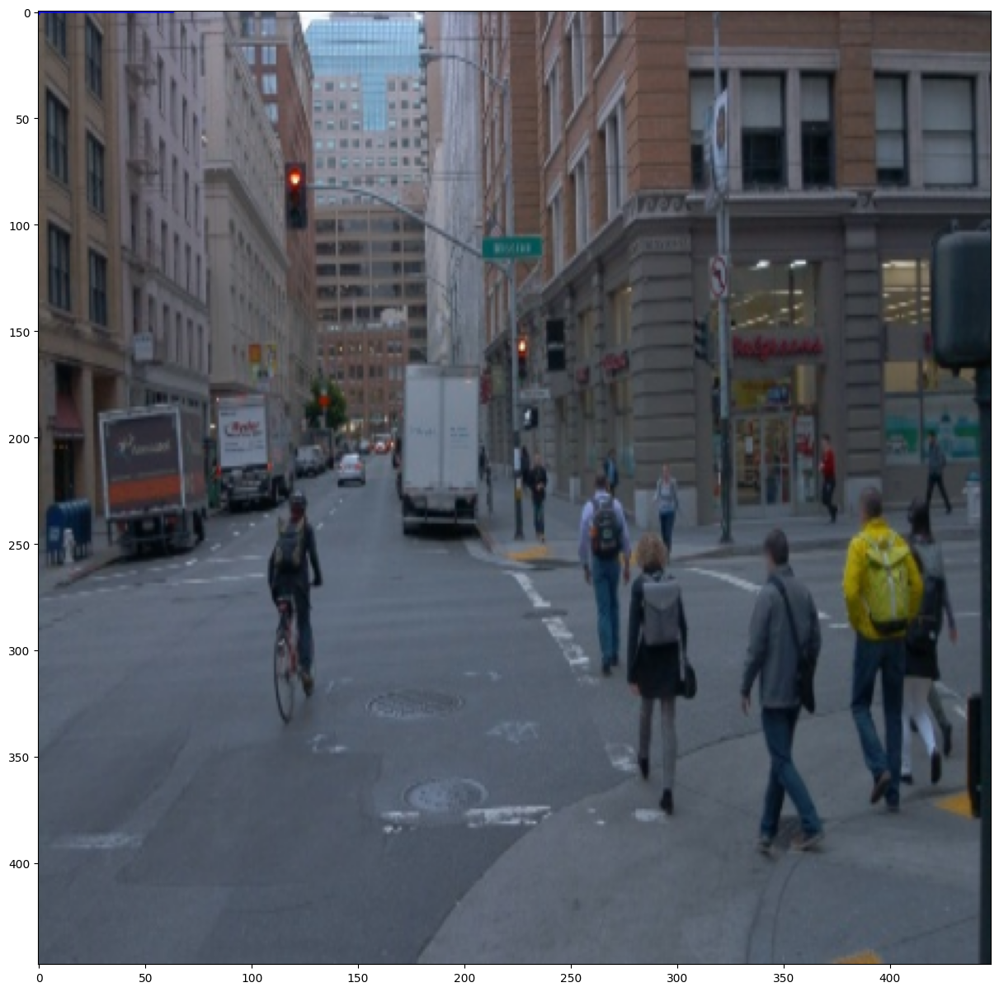

2000 / 8163
Epoch [1/1], Iter [2100/8163], Loss: total=164.938, reg=21.379, containing_obj=37.020, no_obj=1.644, cls=20.527
2100 / 8163
Epoch [1/1], Iter [2200/8163], Loss: total=164.013, reg=21.190, containing_obj=37.326, no_obj=1.570, cls=20.265
2200 / 8163
Epoch [1/1], Iter [2300/8163], Loss: total=163.256, reg=21.034, containing_obj=37.593, no_obj=1.501, cls=20.041
2300 / 8163
Epoch [1/1], Iter [2400/8163], Loss: total=162.463, reg=20.861, containing_obj=37.854, no_obj=1.439, cls=19.872
2400 / 8163
Epoch [1/1], Iter [2500/8163], Loss: total=161.698, reg=20.696, containing_obj=38.103, no_obj=1.381, cls=19.700
2500 / 8163
Epoch [1/1], Iter [2600/8163], Loss: total=161.065, reg=20.553, containing_obj=38.362, no_obj=1.328, cls=19.541
2600 / 8163
Epoch [1/1], Iter [2700/8163], Loss: total=160.453, reg=20.418, containing_obj=38.598, no_obj=1.279, cls=19.380
2700 / 8163
Epoch [1/1], Iter [2800/8163], Loss: total=159.792, reg=20.281, containing_obj=38.809, no_obj=1.233, cls=19.209
2800 / 8

100%|██████████| 492/492 [00:03<00:00, 141.32it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0--- (no predictions for this class)
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=4.706, reg=0.748, containing_obj=0.443, no_obj=0.646, cls=0.330
Updating best test loss: 2315.19087
predicting...
[[(98, 222), (136, 334), 'vehicle', 1, 0.5466406941413879], [(99, 212), (129, 267), 'vehicle', 1, 0.4531463384628296], [(0, 230), (22, 258), 'vehicle', 1, 0.36501848697662354], [(247, 210), (283, 270), 'vehicle', 1, 0.22457846999168396], [(59, 221), (91, 255), 'vehicle', 1, 0.17020496726036072], [(226, 211), (240, 250), 'vehicle', 1, 0.16904114186763763], [(136, 200), (151, 217), 'vehicle', 1, 0.16875949501991272], [(194, 209), (217, 248), 'vehicle', 1, 0.1156674176454544], [(23, 218), (73, 256), 'vehicle', 1, 0.10167261213064194]]


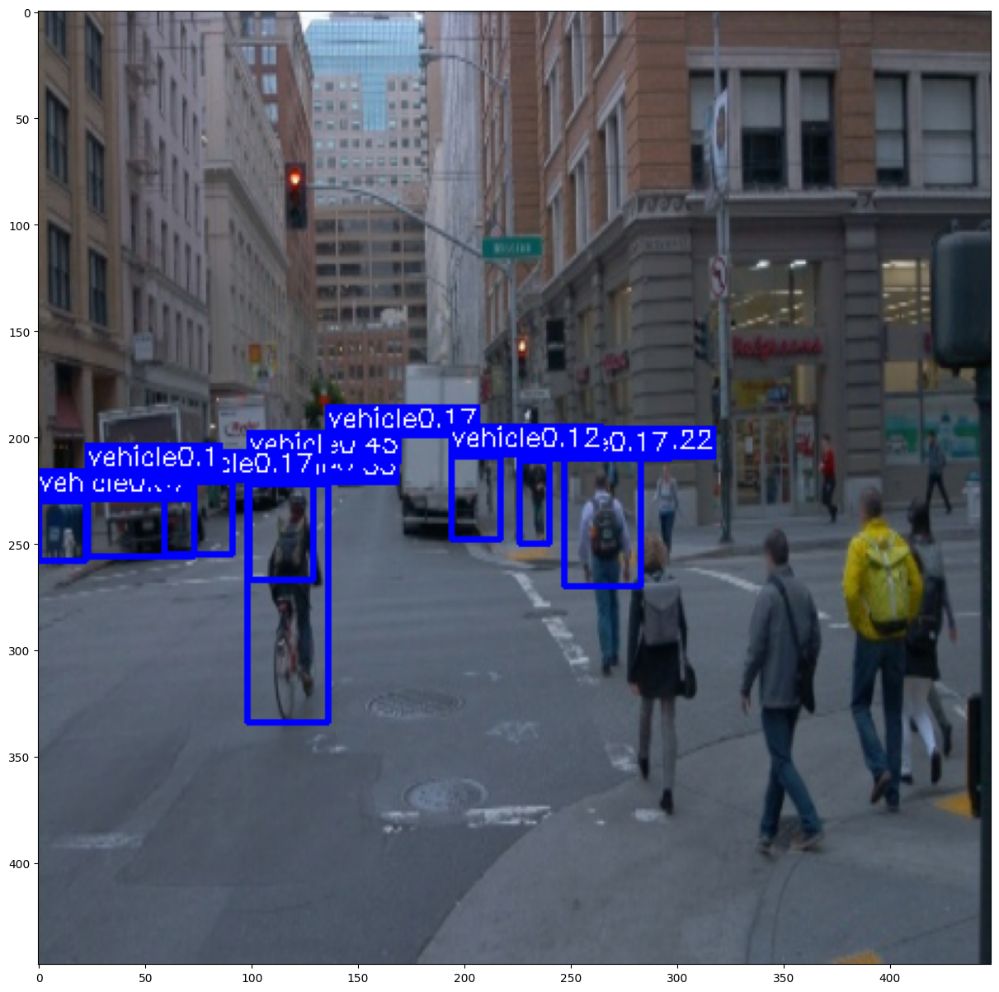

3000 / 8163
Epoch [1/1], Iter [3100/8163], Loss: total=156.801, reg=19.858, containing_obj=38.302, no_obj=1.722, cls=18.693
3100 / 8163
Epoch [1/1], Iter [3200/8163], Loss: total=155.512, reg=19.715, containing_obj=37.794, no_obj=2.056, cls=18.524
3200 / 8163
Epoch [1/1], Iter [3300/8163], Loss: total=154.282, reg=19.575, containing_obj=37.317, no_obj=2.393, cls=18.372
3300 / 8163
Epoch [1/1], Iter [3400/8163], Loss: total=153.175, reg=19.451, containing_obj=36.873, no_obj=2.730, cls=18.227
3400 / 8163
Epoch [1/1], Iter [3500/8163], Loss: total=152.049, reg=19.331, containing_obj=36.388, no_obj=3.043, cls=18.095
3500 / 8163
Epoch [1/1], Iter [3600/8163], Loss: total=151.076, reg=19.226, containing_obj=35.963, no_obj=3.364, cls=17.973
3600 / 8163
Epoch [1/1], Iter [3700/8163], Loss: total=149.979, reg=19.103, containing_obj=35.535, no_obj=3.662, cls=17.828
3700 / 8163
Epoch [1/1], Iter [3800/8163], Loss: total=148.808, reg=18.971, containing_obj=35.105, no_obj=3.930, cls=17.667
3800 / 8

100%|██████████| 492/492 [00:03<00:00, 131.99it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0--- (no predictions for this class)
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=4.558, reg=0.733, containing_obj=0.343, no_obj=0.582, cls=0.377
Updating best test loss: 2242.42202
predicting...
[[(107, 223), (132, 329), 'vehicle', 1, 0.8871607184410095], [(265, 218), (285, 312), 'vehicle', 1, 0.6862305998802185], [(4, 228), (18, 256), 'vehicle', 1, 0.6186723113059998], [(103, 213), (126, 273), 'vehicle', 1, 0.5900781154632568], [(260, 211), (277, 272), 'vehicle', 1, 0.5742620825767517], [(37, 220), (63, 257), 'vehicle', 1, 0.4510003626346588], [(228, 205), (233, 230), 'vehicle', 1, 0.3964609205722809], [(118, 221), (144, 329), 'vehicle', 1, 0.34236761927604675], [(227, 209), (238, 252), 'vehicle', 1, 0.3386482298374176], [(283, 252), (310, 360), 'vehicle', 1, 0.3279721438884735], [(66, 220), (86, 255), 'vehicle', 1, 0.2644557058811188], [(197, 213

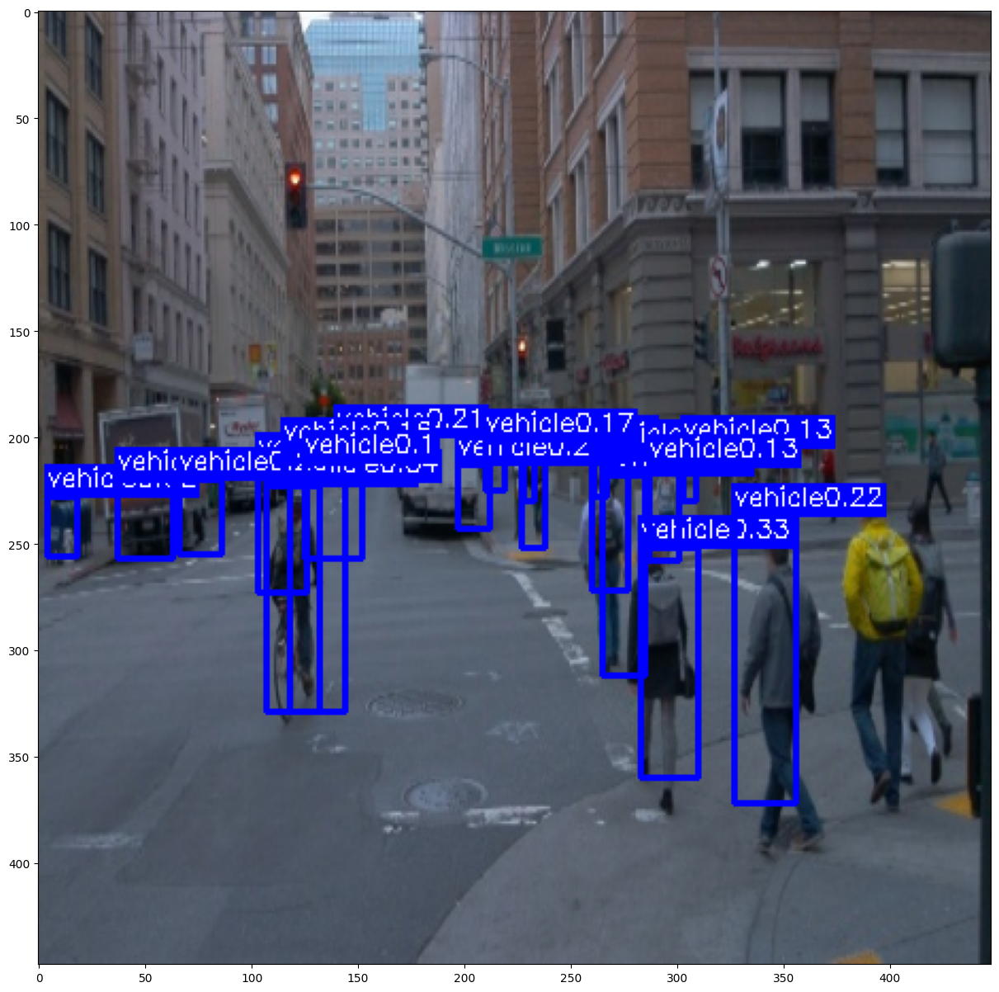

4000 / 8163
Epoch [1/1], Iter [4100/8163], Loss: total=146.019, reg=18.675, containing_obj=33.942, no_obj=4.723, cls=17.283
4100 / 8163
Epoch [1/1], Iter [4200/8163], Loss: total=145.179, reg=18.586, containing_obj=33.585, no_obj=4.978, cls=17.168
4200 / 8163
Epoch [1/1], Iter [4300/8163], Loss: total=144.403, reg=18.504, containing_obj=33.245, no_obj=5.233, cls=17.065
4300 / 8163
Epoch [1/1], Iter [4400/8163], Loss: total=143.599, reg=18.421, containing_obj=32.896, no_obj=5.467, cls=16.956
4400 / 8163
Epoch [1/1], Iter [4500/8163], Loss: total=142.877, reg=18.341, containing_obj=32.575, no_obj=5.696, cls=16.886
4500 / 8163
Epoch [1/1], Iter [4600/8163], Loss: total=142.094, reg=18.256, containing_obj=32.260, no_obj=5.905, cls=16.781
4600 / 8163
Epoch [1/1], Iter [4700/8163], Loss: total=141.370, reg=18.176, containing_obj=31.957, no_obj=6.117, cls=16.701
4700 / 8163
Epoch [1/1], Iter [4800/8163], Loss: total=140.675, reg=18.101, containing_obj=31.670, no_obj=6.326, cls=16.605
4800 / 8

100%|██████████| 492/492 [00:03<00:00, 130.43it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0--- (no predictions for this class)
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=4.504, reg=0.728, containing_obj=0.327, no_obj=0.629, cls=0.349
Updating best test loss: 2215.87328
predicting...
[[(106, 223), (133, 328), 'vehicle', 1, 0.8444132804870605], [(281, 252), (312, 363), 'vehicle', 1, 0.7799999117851257], [(265, 217), (285, 313), 'vehicle', 1, 0.588923454284668], [(4, 228), (17, 255), 'vehicle', 1, 0.5772162675857544], [(326, 238), (356, 373), 'vehicle', 1, 0.5527296662330627], [(103, 214), (126, 273), 'vehicle', 1, 0.4924156665802002], [(260, 211), (278, 270), 'vehicle', 1, 0.48544347286224365], [(36, 221), (63, 256), 'vehicle', 1, 0.4657696783542633], [(354, 241), (378, 365), 'vehicle', 1, 0.4505258798599243], [(388, 255), (411, 395), 'vehicle', 1, 0.4451485276222229], [(229, 206), (234, 229), 'vehicle', 1, 0.40610188245773315], [(339, 2

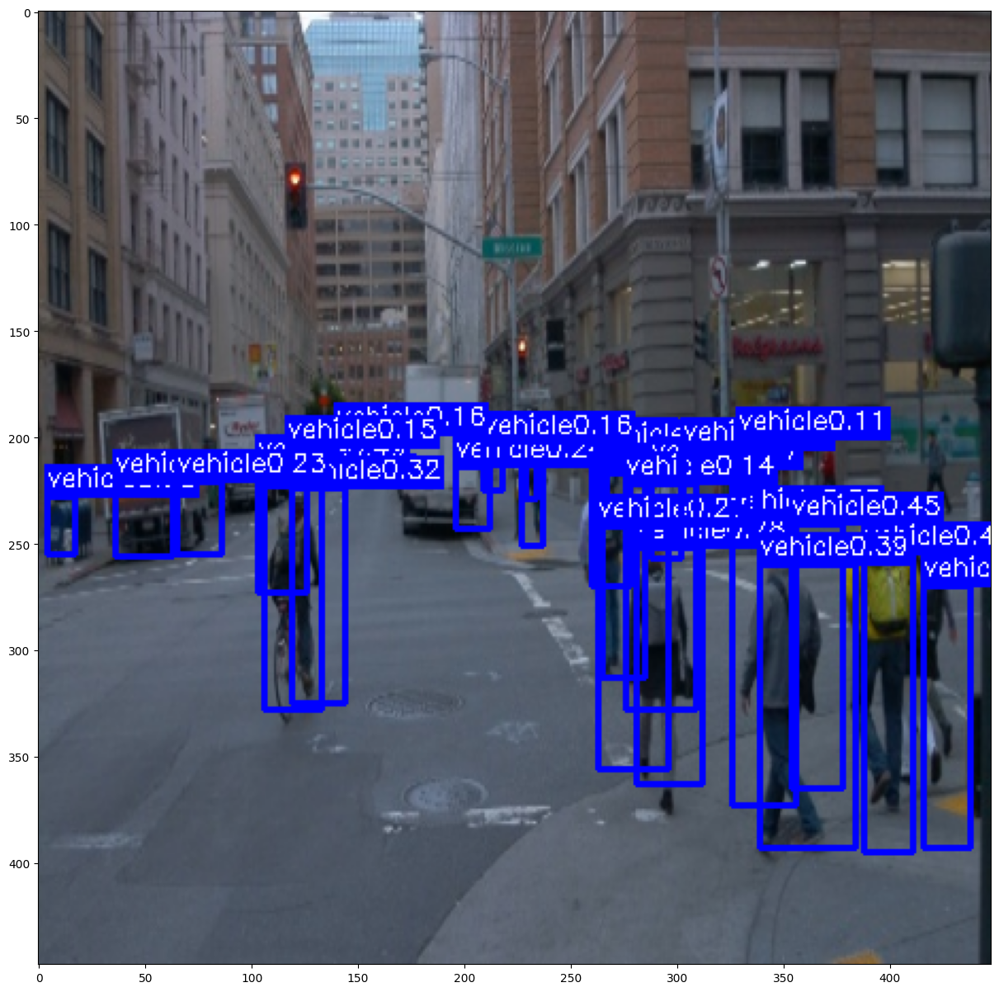

5000 / 8163
Epoch [1/1], Iter [5100/8163], Loss: total=138.732, reg=17.893, containing_obj=30.835, no_obj=6.912, cls=16.360
5100 / 8163
Epoch [1/1], Iter [5200/8163], Loss: total=138.081, reg=17.820, containing_obj=30.562, no_obj=7.097, cls=16.291
5200 / 8163
Epoch [1/1], Iter [5300/8163], Loss: total=137.457, reg=17.753, containing_obj=30.296, no_obj=7.277, cls=16.212
5300 / 8163
Epoch [1/1], Iter [5400/8163], Loss: total=136.804, reg=17.680, containing_obj=30.038, no_obj=7.446, cls=16.133
5400 / 8163
Epoch [1/1], Iter [5500/8163], Loss: total=136.304, reg=17.630, containing_obj=29.805, no_obj=7.618, cls=16.063
5500 / 8163
Epoch [1/1], Iter [5600/8163], Loss: total=135.724, reg=17.569, containing_obj=29.558, no_obj=7.782, cls=15.986
5600 / 8163
Epoch [1/1], Iter [5700/8163], Loss: total=135.219, reg=17.517, containing_obj=29.331, no_obj=7.936, cls=15.922
5700 / 8163
Epoch [1/1], Iter [5800/8163], Loss: total=134.657, reg=17.457, containing_obj=29.097, no_obj=8.091, cls=15.846
5800 / 8

100%|██████████| 492/492 [00:03<00:00, 124.55it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0--- (no predictions for this class)
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=4.392, reg=0.719, containing_obj=0.295, no_obj=0.549, cls=0.336
Updating best test loss: 2161.00866
predicting...
[[(105, 221), (132, 332), 'vehicle', 1, 0.7518346905708313], [(281, 253), (312, 365), 'vehicle', 1, 0.7407806515693665], [(387, 253), (411, 397), 'vehicle', 1, 0.5381722450256348], [(4, 227), (18, 255), 'vehicle', 1, 0.5333226919174194], [(326, 238), (356, 376), 'vehicle', 1, 0.4750199615955353], [(353, 241), (378, 367), 'vehicle', 1, 0.46909570693969727], [(264, 216), (283, 317), 'vehicle', 1, 0.45249658823013306], [(36, 220), (65, 256), 'vehicle', 1, 0.41509509086608887], [(338, 259), (384, 393), 'vehicle', 1, 0.4066318869590759], [(229, 205), (233, 229), 'vehicle', 1, 0.40323182940483093], [(321, 248), (368, 407), 'vehicle', 1, 0.3890388309955597], [(101

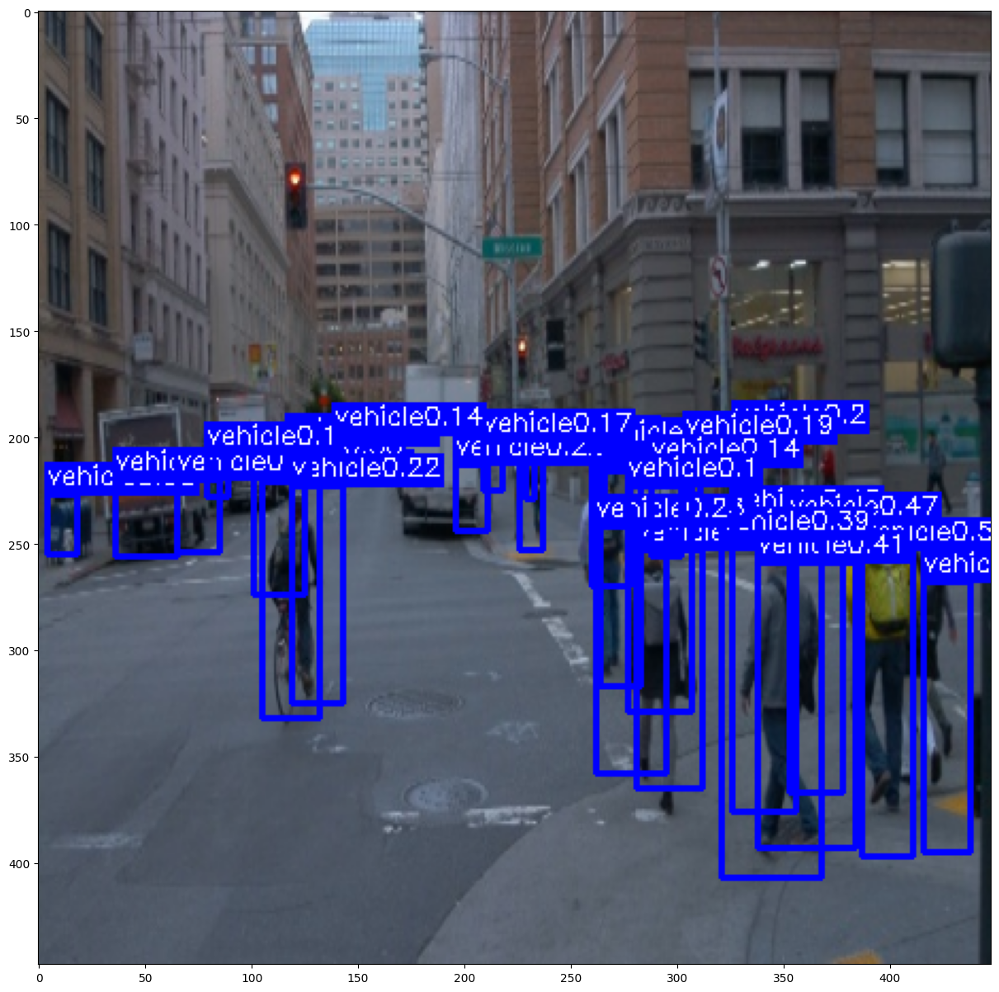

6000 / 8163
Epoch [1/1], Iter [6100/8163], Loss: total=133.127, reg=17.292, containing_obj=28.455, no_obj=8.513, cls=15.658
6100 / 8163
Epoch [1/1], Iter [6200/8163], Loss: total=132.727, reg=17.254, containing_obj=28.255, no_obj=8.649, cls=15.607
6200 / 8163
Epoch [1/1], Iter [6300/8163], Loss: total=132.269, reg=17.208, containing_obj=28.051, no_obj=8.787, cls=15.543
6300 / 8163
Epoch [1/1], Iter [6400/8163], Loss: total=131.858, reg=17.166, containing_obj=27.859, no_obj=8.924, cls=15.490
6400 / 8163
Epoch [1/1], Iter [6500/8163], Loss: total=131.453, reg=17.124, containing_obj=27.672, no_obj=9.059, cls=15.444
6500 / 8163
Epoch [1/1], Iter [6600/8163], Loss: total=131.000, reg=17.075, containing_obj=27.482, no_obj=9.181, cls=15.388
6600 / 8163
Epoch [1/1], Iter [6700/8163], Loss: total=130.523, reg=17.020, containing_obj=27.297, no_obj=9.301, cls=15.334
6700 / 8163
Epoch [1/1], Iter [6800/8163], Loss: total=130.103, reg=16.974, containing_obj=27.123, no_obj=9.411, cls=15.285
6800 / 8

100%|██████████| 492/492 [00:03<00:00, 125.49it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0--- (no predictions for this class)
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=4.467, reg=0.719, containing_obj=0.302, no_obj=0.608, cls=0.388
predicting...
[[(105, 221), (133, 332), 'vehicle', 1, 0.7602707743644714], [(281, 251), (312, 367), 'vehicle', 1, 0.7549466490745544], [(4, 227), (18, 255), 'vehicle', 1, 0.5597962737083435], [(387, 252), (412, 398), 'vehicle', 1, 0.5376269221305847], [(326, 237), (356, 377), 'vehicle', 1, 0.48961374163627625], [(352, 239), (378, 369), 'vehicle', 1, 0.4854852855205536], [(264, 216), (284, 317), 'vehicle', 1, 0.47412365674972534], [(36, 220), (65, 256), 'vehicle', 1, 0.43107178807258606], [(229, 206), (233, 229), 'vehicle', 1, 0.40871429443359375], [(338, 259), (384, 394), 'vehicle', 1, 0.4043973386287689], [(101, 214), (125, 272), 'vehicle', 1, 0.39371809363365173], [(260, 211), (278, 270), 'vehicle', 1, 0

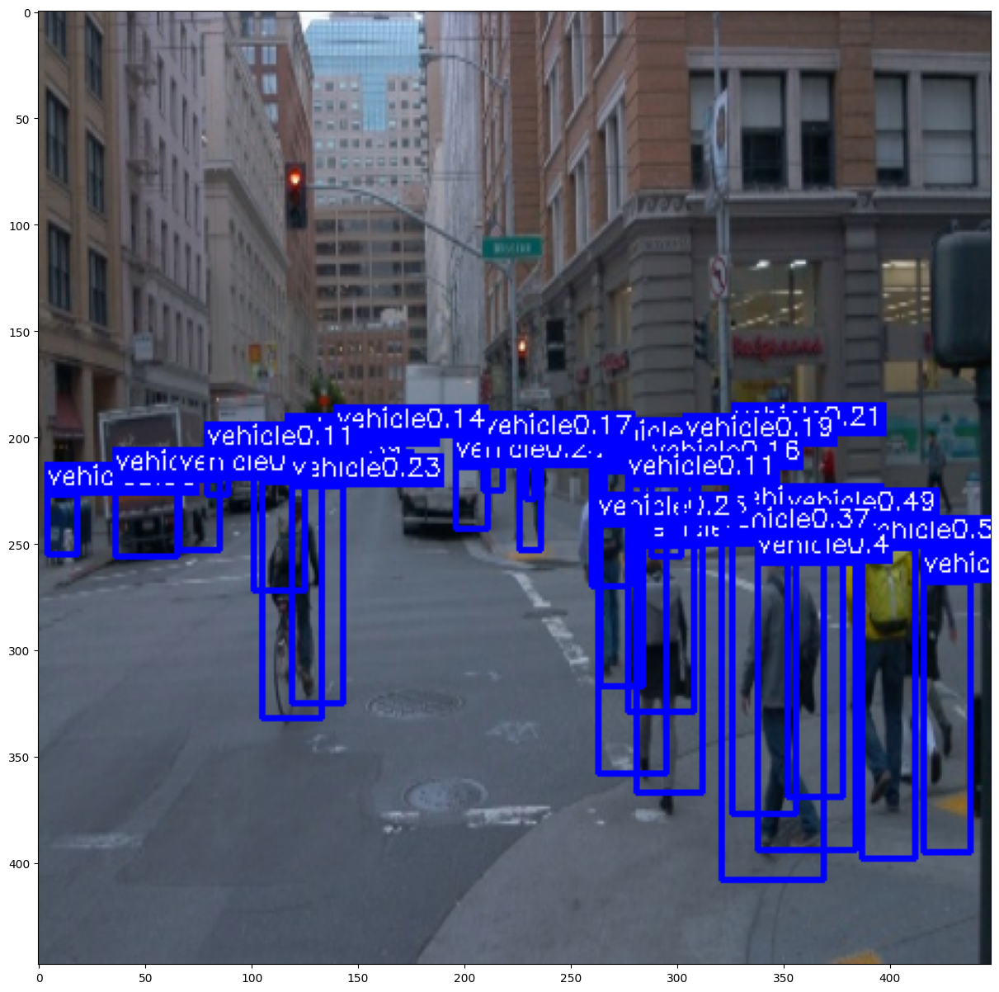

7000 / 8163
Epoch [1/1], Iter [7100/8163], Loss: total=129.001, reg=16.855, containing_obj=26.639, no_obj=9.739, cls=15.166
7100 / 8163
Epoch [1/1], Iter [7200/8163], Loss: total=128.695, reg=16.825, containing_obj=26.486, no_obj=9.849, cls=15.132
7200 / 8163
Epoch [1/1], Iter [7300/8163], Loss: total=128.369, reg=16.790, containing_obj=26.342, no_obj=9.945, cls=15.091
7300 / 8163
Epoch [1/1], Iter [7400/8163], Loss: total=128.025, reg=16.755, containing_obj=26.190, no_obj=10.057, cls=15.042
7400 / 8163
Epoch [1/1], Iter [7500/8163], Loss: total=127.703, reg=16.722, containing_obj=26.047, no_obj=10.148, cls=14.999
7500 / 8163
Epoch [1/1], Iter [7600/8163], Loss: total=127.347, reg=16.684, containing_obj=25.905, no_obj=10.238, cls=14.949
7600 / 8163
Epoch [1/1], Iter [7700/8163], Loss: total=127.117, reg=16.663, containing_obj=25.787, no_obj=10.329, cls=14.916
7700 / 8163
Epoch [1/1], Iter [7800/8163], Loss: total=126.831, reg=16.633, containing_obj=25.654, no_obj=10.420, cls=14.886
780

100%|██████████| 492/492 [00:03<00:00, 124.84it/s]


---class vehicle ap 0.0---
---class pedestrian ap 0.0--- (no predictions for this class)
---class cyclist ap 0.0--- (no predictions for this class)
---map 0.0---
0 [0.0, 0.0, 0.0]
Epoch [1/1], Iter [492/492], Loss: total=4.441, reg=0.721, containing_obj=0.288, no_obj=0.517, cls=0.394
predicting...
[[(106, 219), (132, 333), 'vehicle', 1, 0.755529522895813], [(280, 250), (312, 367), 'vehicle', 1, 0.7534297108650208], [(4, 226), (18, 255), 'vehicle', 1, 0.5498799085617065], [(386, 250), (412, 399), 'vehicle', 1, 0.5296346545219421], [(352, 239), (378, 369), 'vehicle', 1, 0.5148403644561768], [(327, 235), (356, 379), 'vehicle', 1, 0.4940474331378937], [(264, 214), (284, 318), 'vehicle', 1, 0.470001757144928], [(37, 219), (65, 256), 'vehicle', 1, 0.42330774664878845], [(102, 212), (125, 274), 'vehicle', 1, 0.4040879011154175], [(229, 206), (233, 229), 'vehicle', 1, 0.3872774541378021], [(417, 267), (438, 394), 'vehicle', 1, 0.3869432806968689], [(338, 257), (384, 394), 'vehicle', 1, 0.38629

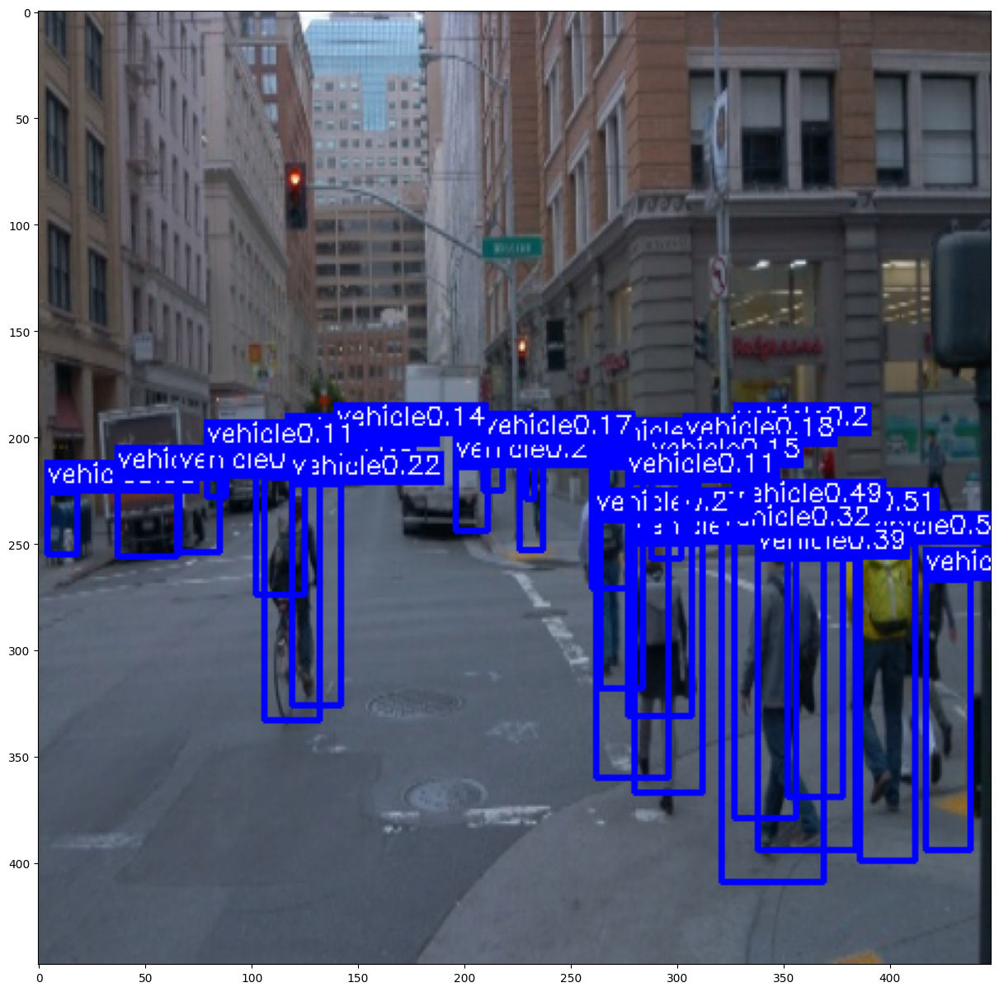

8000 / 8163
Epoch [1/1], Iter [8100/8163], Loss: total=126.043, reg=16.552, containing_obj=25.293, no_obj=10.672, cls=14.790
8100 / 8163


In [8]:
best_test_loss = np.inf
learning_rate = 0.001
for epoch in range(num_epochs):
    net.train()
    
    # Update learning rate late in training
    
    
    print('\n\nStarting epoch %d / %d' % (epoch + 1, num_epochs))
    print('Learning Rate for this epoch: {}'.format(learning_rate))
    
    total_loss = collections.defaultdict(int)
    
    for i, data in enumerate(train_loader):


        if i == 3000 or i == 6000:
            learning_rate /= 10.0

            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate


        data = (item.to(device) for item in data)
        images, target_boxes, target_cls, has_object_map, dimg = data
        pred = net(images)
        if(i % 100 == 0):
            print(i, "/", len(train_loader))
        # print(pred[:, :, :, -20:])
        loss_dict = criterion(pred, target_boxes, target_cls, has_object_map)
        for key in loss_dict:
            total_loss[key] += loss_dict[key].item()
        
        optimizer.zero_grad()
        loss_dict['total_loss'].backward()
        optimizer.step()
        
        if (i+1) % 100 == 0:
            outstring = 'Epoch [%d/%d], Iter [%d/%d], Loss: ' % ((epoch+1, num_epochs, i+1, len(train_loader)))
            outstring += ', '.join( "%s=%.3f" % (key[:-5], val / (i+1)) for key, val in total_loss.items() )
            print(outstring)
    
    # evaluate the network on the test data
        if (i+1) % 1000 == 0:
            print('evaluating')
            test_aps = evaluate(net, test_loader)
            print(epoch, test_aps)
            with torch.no_grad():
                test_loss = collections.defaultdict(int)
                net.eval()
                for i, data in enumerate(test_loader):
                    data = (item.to(device) for item in data)
                    images, target_boxes, target_cls, has_object_map, dimg, bxs, lbls = data
                    
                    pred = net(images)
                    loss_dict = criterion(pred, target_boxes, target_cls, has_object_map)
                    for key in loss_dict:
                        test_loss[key] += loss_dict[key].item()
            
            outstring = 'Epoch [%d/%d], Iter [%d/%d], Loss: ' % ((epoch+1, num_epochs, i+1, len(test_loader)))
            outstring += ', '.join( "%s=%.3f" % (key[:-5], val / (i+1)) for key, val in test_loss.items() )
            print(outstring)
            if best_test_loss > test_loss['total_loss']:
                best_test_loss = test_loss['total_loss']
                print('Updating best test loss: %.5f' % best_test_loss)
                torch.save(net.state_dict(),'checkpoints/best_detector3.pth')

            image_name = "test"
            image = cv2.imread('/home/albyyuggle/Code/CS498/FP/data/30779396576054160_1880_000_1900_000/1557845072664263_cam_1.jpg', cv2.IMREAD_COLOR)
            image = cv2.resize(image, (448, 448))

            print('predicting...')
            result = predict_image(net, image, image_name=1)
            print(result)
            for left_up, right_bottom, class_name, _, prob in result:
                color = COLORS[VOC_CLASSES.index(class_name)]
                cv2.rectangle(image, left_up, right_bottom, color, 2)
                label = class_name + str(round(prob, 2))
                text_size, baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
                p1 = (left_up[0], left_up[1] - text_size[1])
                cv2.rectangle(image, (p1[0] - 2 // 2, p1[1] - 2 - baseline), (p1[0] + text_size[0], p1[1] + text_size[1]),
                            color, -1)
                cv2.putText(image, label, (p1[0], p1[1] + baseline), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1, 8)

            plt.figure(figsize = (15,15))
            plt.imshow(image)
            plt.show()


        net.train()

    torch.save(net.state_dict(),'checkpoints/detector3.pth')
    


# View example predictions

predicting...
[[(108, 224), (129, 328), 'vehicle', 1, 0.14382407069206238]]


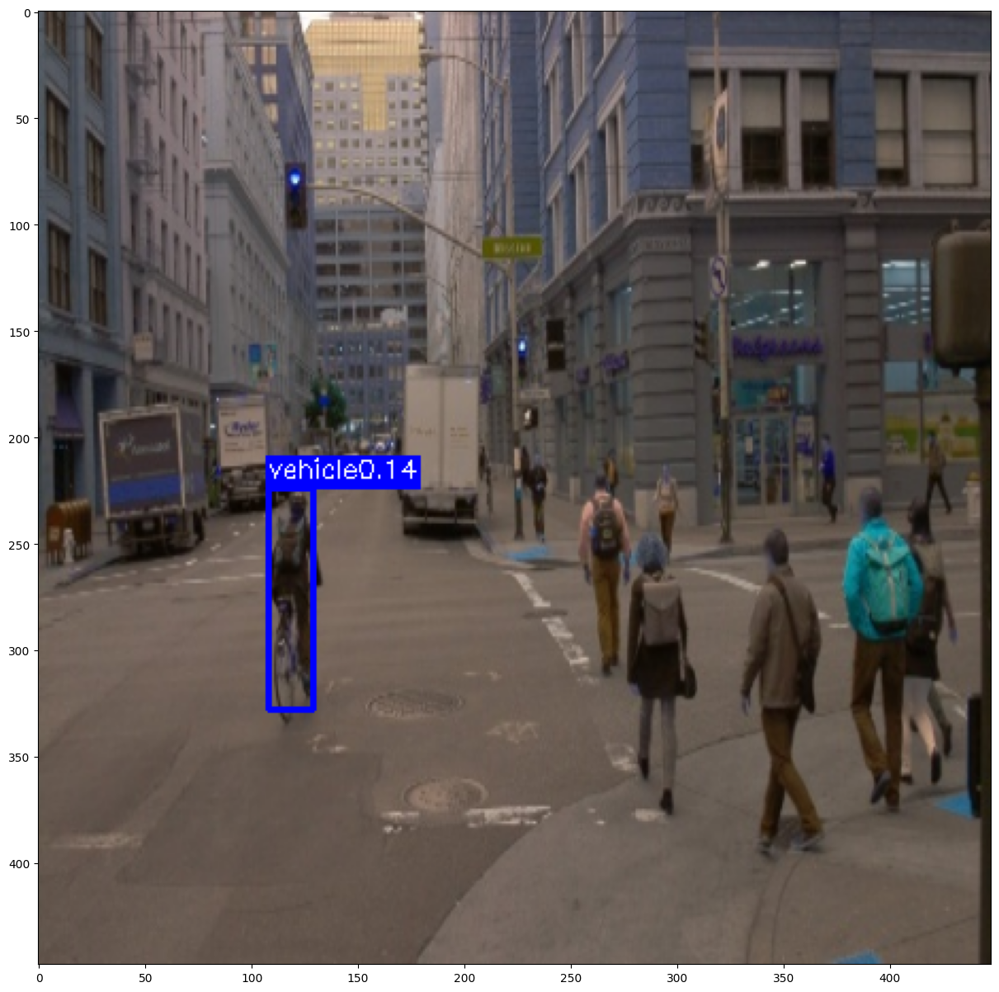

In [ ]:
net.eval()

# select random image from test set
image_name = "test"
image = cv2.imread('/home/albyyuggle/Code/CS498/FP/data/30779396576054160_1880_000_1900_000/1557845072664263_cam_1.jpg', cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image = cv2.resize(image, (448, 448))

print('predicting...')
result = predict_image(net, image, image_name=1)
print(result)
for left_up, right_bottom, class_name, _, prob in result:
    color = COLORS[VOC_CLASSES.index(class_name)]
    cv2.rectangle(image, left_up, right_bottom, color, 2)
    label = class_name + str(round(prob, 2))
    text_size, baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.4, 1)
    p1 = (left_up[0], left_up[1] - text_size[1])
    cv2.rectangle(image, (p1[0] - 2 // 2, p1[1] - 2 - baseline), (p1[0] + text_size[0], p1[1] + text_size[1]),
                  color, -1)
    cv2.putText(image, label, (p1[0], p1[1] + baseline), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1, 8)

plt.figure(figsize = (15,15))
plt.imshow(image)


## Evaluate on Test

To evaluate detection results we use mAP (mean of average precision over each class)

In [ ]:
test_aps = evaluate(net, test_dataset_file=annotation_file_test, img_root=file_root_test)

### Cell added to get intermediate mAP values for students

In [ ]:
network_paths = ['detector_epoch_%d.pth' % epoch for epoch in [5, 10, 20, 30, 40]]+['detector.pth']
for load_network_path in network_paths:
    print('Loading saved network from {}'.format(load_network_path))
    net_loaded =  resnet50().to(device)
    net_loaded.load_state_dict(torch.load(load_network_path))
    evaluate(net_loaded, test_dataset_file=annotation_file_test)


In [ ]:
output_submission_csv('my_new_solution.csv', test_aps)